# Self-Driving Car Nanodegree

## Project 4: Advanced Lane Finding

Miguel Morales | [@mimoralea](https://twitter.com/mimoralea) | [mimoralea@gmail.com](mailto:mimoralea@gmail.com)

In this project, we used advanced Computer Vision techniques to find road lane lines on images and video streams. First, we calibrated the camera obtaining the camera matrix and distortion coefficients. Then we created a pipeline of advanced methods to correctly identify lane line pixels, and finally applied these methods to video streams using confidence levels to detect and track the lines through the video.

### Camera Calibration

No sensor is perfect, and a camera is just one more sensor. To make sure the images and videos we get from cameras are the best possible representation of the world they are sensing, there are some calibration steps we can perform. Thankfully, OpenCV makes this process very straight-forward.

#### Obtaining matrix and coefficients

First, lets load some libraries and functions that we will be using throughout the project:

In [18]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

import numpy as np
import cv2
import pylab
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob

def get_calibration_coef(cal_imgs, nx=9, ny=6, plot=False):
    objpoints = []
    imgpoints = []
    drawnimgs = []
    
    objp = np.zeros((nx*ny, 3), np.float32)
    objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1, 2)

    fnames = glob.glob(cal_imgs)

    for fname in fnames:
        img = mpimg.imread(fname)

        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

        # if chessboard corners were not found, continue to next image
        if not ret:
            continue

        # save the points to calibrate later
        imgpoints.append(corners)
        objpoints.append(objp)

        # no need to waste cycles if do not want plotting
        if not plot:
            continue

        # draw points in the img and save a copy
        cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        drawnimgs.append(img)

    return objpoints, imgpoints, drawnimgs

def calibrate(img_shape, objpoints, imgpoints):
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(
        objpoints, imgpoints, img_shape, None, None)
    return mtx, dist

def undistort(img, mtx, dist):
    return cv2.undistort(img, mtx, dist, None, mtx)

def cal_undistort(img, objpoints, imgpoints, mtx=None, dist=None):

    if mtx==None or dist==None:
        mtx, dist = calibrate(img.shape[0:2], objpoints, imgpoints)

    undist = undistort(img, mtx, dist)
    return undist, mtx, dist

def plot_imgs(imgs):
    fig = plt.figure(figsize=(20,50))
    for i in range(len(imgs)):
        img = imgs[i]

        ax = fig.add_subplot(9, 3, i + 1)
        ax.grid(False)
        ax.get_xaxis().set_ticks([])
        ax.get_yaxis().set_ticks([])
        ax.imshow(img)
    plt.show()

def plot_side_by_side(img1, title1, img2, title2):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img1, cmap='gray')
    ax1.set_title(title1, fontsize=50)
    ax2.imshow(img2, cmap='gray')
    ax2.set_title(title2, fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()

def get_perspective(img_size, src=None, dst=None, inv=False):
    x, y = img_size

    if src == None or dst == None:
        src = np.float32([
                (100, y),
                (x/2 - 150, y*5/7),
                (x/2 + 150, y*5/7),
                (x - 100, y)
            ])
        dst = np.float32([
                (100, y),
                (100, 0),
                (x - 100, 0),
                (x - 100, y)
            ])
    return cv2.getPerspectiveTransform(src, dst) if not inv else cv2.getPerspectiveTransform(dst, src)

def corners_unwarp(img, mtx, dist, src=None, dst=None):
    img_size = (img.shape[1], img.shape[0])
    M = get_perspective(img_size, src, dst)
    warped = cv2.warpPerspective(img, M, img_size, flags = cv2.INTER_LINEAR)
    return warped, M

Next, we can obtain the calibration matrix and coefficients from the provided images:

In [5]:
udobjpoints, udimgpoints, udimgs = get_calibration_coef('ud_cal/calibration*.jpg', plot=True)

Also, Let's take a look at the images that we used to obtain the calibration parameters:

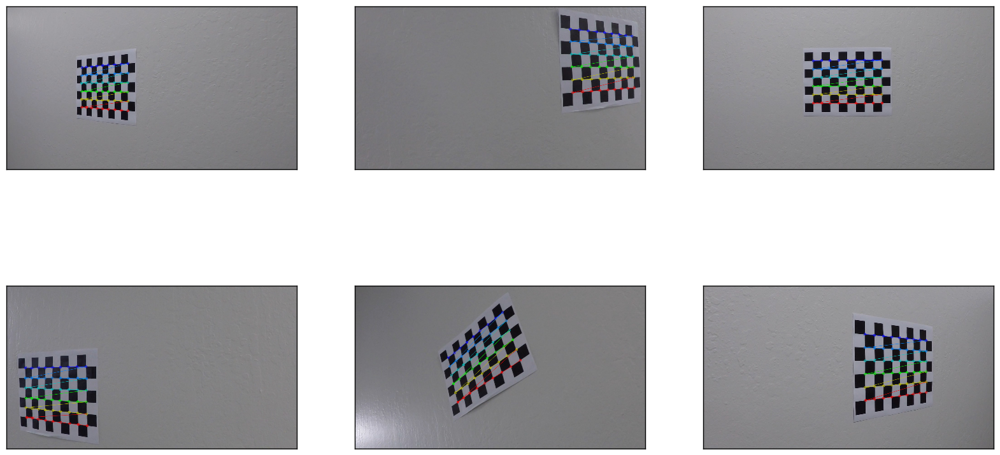

In [12]:
plot_imgs(udimgs[0:6])

We will also be using some images and videos taken with another camera, so let's obtain the matrix and coefficients for this camera as well. Additionally, let's also plot some of the images we used to do this new calibration.

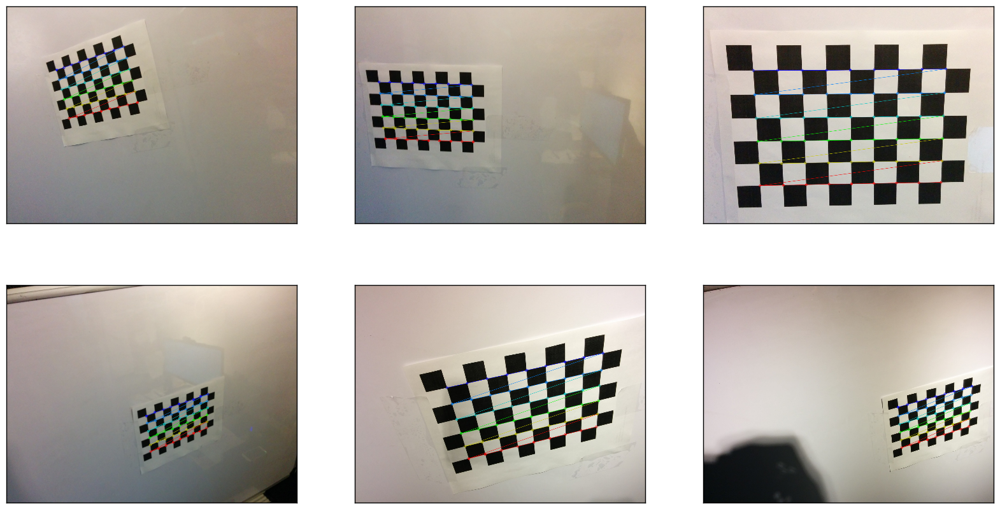

In [11]:
myobjpoints, myimgpoints, myimgs = get_calibration_coef('my_cal/calibration*.jpg', plot=True)
plot_imgs(myimgs[0:6])

#### Undistorting test images

We obtained the matrices and coefficients from the previous step. These values can be used to distort new images we pass into. But also, from this step, we get a matrix and a distortion values that we can reuse later on.

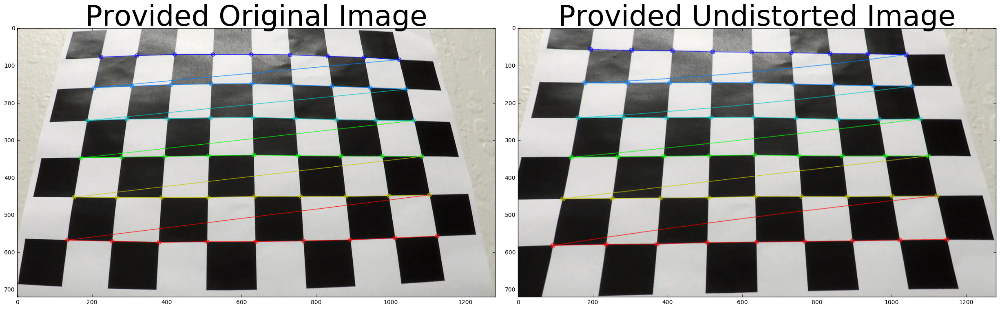

In [22]:
udimg = udimgs[10]
udundistorted, udmtx, uddist = cal_undistort(udimg, udobjpoints, udimgpoints)
plot_side_by_side(udimg, 'Provided Original Image', udundistorted, 'Provided Undistorted Image')

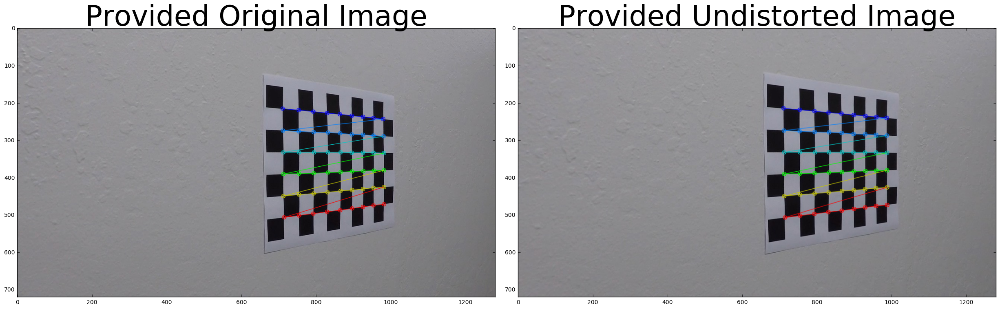

In [23]:
udimg = udimgs[5]
udundistorted, udmtx, uddist = cal_undistort(udimg, udobjpoints, udimgpoints, udmtx, uddist)
plot_side_by_side(udimg, 'Provided Original Image', udundistorted, 'Provided Undistorted Image')

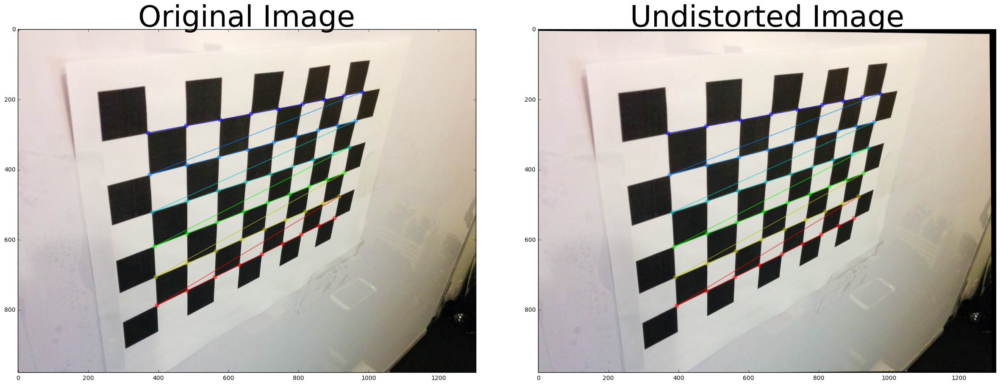

In [24]:
myimg = myimgs[-3]
myundistorted, mymtx, mydist = cal_undistort(myimg, myobjpoints, myimgpoints)
plot_side_by_side(myimg, 'Original Image', myundistorted, 'Undistorted Image')

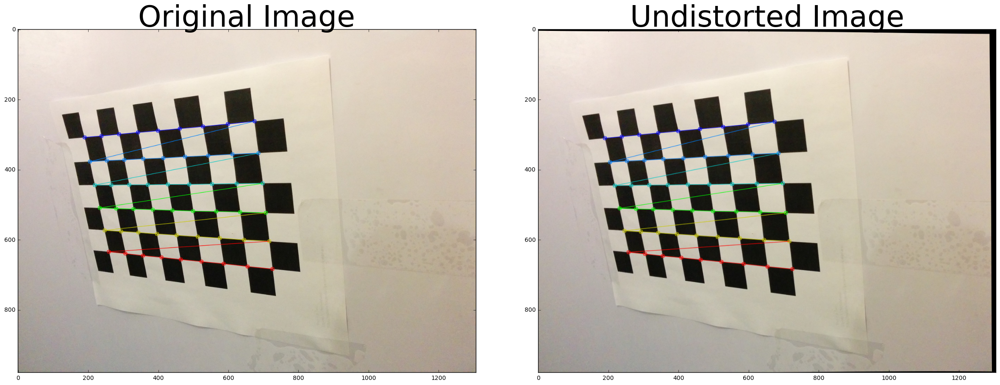

In [26]:
myimg = myimgs[10]
myundistorted, mymtx, mydist = cal_undistort(myimg, myobjpoints, myimgpoints, mymtx, mydist)
plot_side_by_side(myimg, 'Original Image', myundistorted, 'Undistorted Image')

Excellent. In steps above, we were able to calibrate a camera and use it to undistort images. Let's now work into building an advanced Computer Vision pipeline to effectively detect and track lane lines on roads.

### Pipeline

In this section, we will dive deep into the Computer Vision techniques used to detect lane lines in roads of diverse conditions. First, we will look at each processing step of the pipeline in detail, and then we will create a function to process images with a single call.

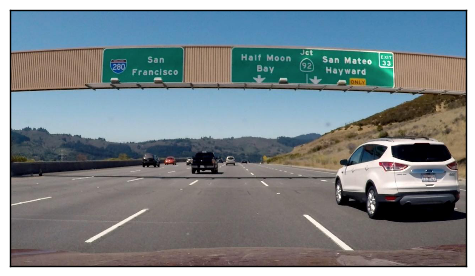

In [29]:
udimg = mpimg.imread('ud_images/signs_vehicles_xygrad.jpg')

plot_imgs([udimg])

#### Distortion Correction

The first step of the pipeline is to correct the distortion of the image above. As we can see, this camera clearly shows radial distortion as we can see how some lines that appear to be curved intuitively shouldn't. Good news is, we already have the camera matrix and distortion coefficients, so we can simply use these values to undistort any new image.

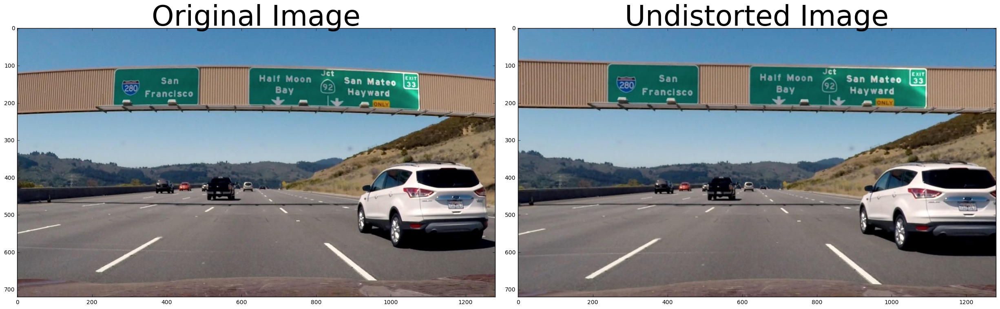

In [31]:
udundistorted = undistort(udimg, udmtx, uddist)
plot_side_by_side(udimg, 'Original Image', udundistorted, 'Undistorted Image')

#### Binary Image Creation

#### Perspective Transform

#### Identifying Lane Line Pixels

#### Lane Curvature and Car Positioning

#### Putting Everything Together

### Processing Video

#### Confidence-Based Lane Detection

#### Confidence-Based Lane Tracking

### Results

#### Provided Videos

#### New Videos

### Reflections

#### Further Improvements

#### Hypothetical flaws